## Lesson 4 - PTT Crawler




### Table of Contents

* [Web Crawler - PTT](#ptt-crawler)
* [Hack PTT age check as an adult](#cookie)
* [Crawl PTT post by link](#Crawl-ptt-post-by-link)
* [Crawl ptt board by name](#Crawl-ptt-board-by-name)
* [Check your DataFrame data set](#Check-DataFrame-data)
* [Data Visualization](#Short-Visualization)
* [PTT Gossiping Word cloud](#word-cloud)
* [Read PTT Sentimental data set](#ptt-sentimental-data-set)

<a id="ptt-crawler"></a>
### Import Package

In [1]:
#coding=utf-8 
import re, json, requests, time, datetime
import pandas as pd
import numpy as np
import io, json
from bs4 import BeautifulSoup

import sys
import os
from os import path
import jieba
import jieba.analyse as analyse
from collections import Counter
from wordcloud import WordCloud
from matplotlib import pyplot as plt
%matplotlib inline
from PIL import Image

requests.packages.urllib3.disable_warnings()

### Crawl single post from ptt.cc by using requests package

In [2]:
import requests

r = requests.get('https://www.ptt.cc/bbs/PlayStation/M.1573432057.A.3EA.html')
print (r.text[:200])

<!DOCTYPE html>
<html>
	<head>
		<meta charset="utf-8">
		

<meta name="viewport" content="width=device-width, initial-scale=1">

<title>[情報] 「死亡擱淺」首週銷量是「往日不再」64% - 看板 PlayStation - 批踢踢實業坊</title>
<me


In [3]:
import requests

r = requests.get('https://github.com/timeline.json')

jString = r.json()
print (jString)

{'message': 'Hello there, wayfaring stranger. If you’re reading this then you probably didn’t see our blog post a couple of years back announcing that this API would go away: http://git.io/17AROg Fear not, you should be able to get what you need from the shiny new Events API instead.', 'documentation_url': 'https://docs.github.com/v3/activity/events/#list-public-events'}


In [4]:
### 解析 JSON
for x in jString:
    print("key: {}".format(x))
    print(jString[x])
    print("="*5)

key: message
Hello there, wayfaring stranger. If you’re reading this then you probably didn’t see our blog post a couple of years back announcing that this API would go away: http://git.io/17AROg Fear not, you should be able to get what you need from the shiny new Events API instead.
=====
key: documentation_url
https://docs.github.com/v3/activity/events/#list-public-events
=====


In [5]:
## Store cookie sessioin with connection
rs = requests.session()
r = rs.get('https://www.ptt.cc/bbs/PlayStation/M.1573432057.A.3EA.html')
html_data = r.text
html_data

'<!DOCTYPE html>\n<html>\n\t<head>\n\t\t<meta charset="utf-8">\n\t\t\n\n<meta name="viewport" content="width=device-width, initial-scale=1">\n\n<title>[情報] 「死亡擱淺」首週銷量是「往日不再」64% - 看板 PlayStation - 批踢踢實業坊</title>\n<meta name="robots" content="all">\n<meta name="keywords" content="Ptt BBS 批踢踢">\n<meta name="description" content="https://www.gamesindustry.biz/articles/2019-11-10-uk-\ncharts-death-stranding-is-the-second-biggest-ps4-launch-of-2019\nUK 首週銷售量：&#34;死亡擱淺&#34;比&#34;往日不再&#34;的首週少 36%。\n（即只有 64%）。\n更新：首週 UK 紀錄，參考資料\n">\n<meta property="og:site_name" content="Ptt 批踢踢實業坊">\n<meta property="og:title" content="[情報] 「死亡擱淺」首週銷量是「往日不再」64%">\n<meta property="og:description" content="https://www.gamesindustry.biz/articles/2019-11-10-uk-\ncharts-death-stranding-is-the-second-biggest-ps4-launch-of-2019\nUK 首週銷售量：&#34;死亡擱淺&#34;比&#34;往日不再&#34;的首週少 36%。\n（即只有 64%）。\n更新：首週 UK 紀錄，參考資料\n">\n<link rel="canonical" href="https://www.ptt.cc/bbs/PlayStation/M.1573432057.A.3EA.html">\n\n<link rel="style

<a id="cookie"></a>
### 我未滿18歲?

In [6]:
rs = requests.session()

r = rs.get('https://www.ptt.cc/bbs/Gossiping/M.1616112457.A.A8D.html')
html_data = r.text
html_data

'<!DOCTYPE html>\n<html>\n\t<head>\n\t\t<meta charset="utf-8">\n\t\t\n\n<meta name="viewport" content="width=device-width, initial-scale=1">\n\n<title>批踢踢實業坊</title>\n\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-common.css">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-base.css" media="screen">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-custom.css">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/pushstream.css" media="screen">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-print.css" media="print">\n\n\n\n\n\t</head>\n    <body>\n\t\t\n<div class="bbs-screen bbs-content">\n    <div class="over18-notice">\n        <p>本網站已依網站內容分級規定處理</p>\n\n        <p>警告︰您即將進入之看板內容需滿十八歲方可瀏覽。</p>\n\n        <p>若您尚未年滿十八歲，請點選離開。若您已滿十八歲，亦不可將本區之內容派發、傳閱、出售、出租、交給或借予年齡未滿18歲的人士瀏覽，或將本網站內容向該人士出示、播放或放映。</p>\n    </div>\n</div>\n\n<div class="bbs-screen bbs-content cent

### 用一行程式讓自己成年

In [7]:
import requests

rs = requests.session()

cookie = {'over18': '1'}
r = rs.get('https://www.ptt.cc/bbs/Gossiping/M.1616112457.A.A8D.html', cookies=cookie)
html_data = r.text
html_data

'<!DOCTYPE html>\n<html>\n\t<head>\n\t\t<meta charset="utf-8">\n\t\t\n\n<meta name="viewport" content="width=device-width, initial-scale=1">\n\n<title>[新聞] UberEats爆出接單神器！外掛一開「不到10 - 看板 Gossiping - 批踢踢實業坊</title>\n<meta name="robots" content="all">\n<meta name="keywords" content="Ptt BBS 批踢踢">\n<meta name="description" content="1.媒體來源:\n※ 例如蘋果日報、自由時報（請參考版規下方的核准媒體名單）\nettoday\n2.記者署名:\n※ 若新聞沒有記者名字或編輯名字，請勿張貼，否則會被水桶14天\n">\n<meta property="og:site_name" content="Ptt 批踢踢實業坊">\n<meta property="og:title" content="[新聞] UberEats爆出接單神器！外掛一開「不到10">\n<meta property="og:description" content="1.媒體來源:\n※ 例如蘋果日報、自由時報（請參考版規下方的核准媒體名單）\nettoday\n2.記者署名:\n※ 若新聞沒有記者名字或編輯名字，請勿張貼，否則會被水桶14天\n">\n<link rel="canonical" href="https://www.ptt.cc/bbs/Gossiping/M.1616112457.A.A8D.html">\n\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-common.css">\n<link rel="stylesheet" type="text/css" href="//images.ptt.cc/bbs/v2.27/bbs-base.css" media="screen">\n<link rel="stylesheet" type="text/css

<a id="Crawl-ptt-post-by-link"></a>
### pick up a ptt Gossiping post link from browser

In [8]:
url = "https://www.ptt.cc/bbs/Gossiping/M.1616112457.A.A8D.html"

In [9]:
def over18(PttName):
    # over 18
    load={
        'from':'/bbs/'+PttName+'/index.html',
        'yes':'yes' 
    }
    res=rs.post('https://www.ptt.cc/ask/over18',verify=False,data=load)
over18(url.replace("https://www.ptt.cc/bbs/", "").split("/")[0])

In [10]:
# 此時的 rs 物件已經滿18歲了
web = rs.get(url, timeout=60)
soup = BeautifulSoup(web.text,'html.parser')

In [11]:
# author
author = soup.select('.article-meta-value')[0].text
#author = soup.find("span", {'class': 'article-meta-value'}).text
print("AUTHOR: \n", author)

AUTHOR: 
 bboy0720 (D3理財週報)


In [12]:
# title
title = soup.select('.article-meta-value')[2].text
print("TITLE: \n", title)

TITLE: 
 [新聞] UberEats爆出接單神器！外掛一開「不到10


In [13]:
# date
date = soup.select('.article-meta-value')[3].text
print("DATE: \n", date)

DATE: 
 Fri Mar 19 08:07:35 2021


In [14]:
# ip       
try:
    targetIP=u'※ 發信站: 批踢踢實業坊'
    ip =  soup.find(string = re.compile(targetIP))
    ip = re.search(r"[0-9]*\.[0-9]*\.[0-9]*\.[0-9]*",ip).group()
except:
    ip = "ip is not find"
print("IP: \n", ip)

IP: 
 76.191.19.54


In [15]:
# content
content = soup.find(id="main-content").text
target_content=u'※ 發信站: 批踢踢實業坊(ptt.cc),'
content = content.split(target_content)
content = content[0].split(date)
main_content = content[1].replace('\n', '  ').replace('\t', '  ')
print("CONTENT: \n", main_content)

CONTENT: 
       1.媒體來源:  ※ 例如蘋果日報、自由時報（請參考版規下方的核准媒體名單）    ettoday    2.記者署名:  ※ 若新聞沒有記者名字或編輯名字，請勿張貼，否則會被水桶14天  ※ 外電至少要有來源或編輯 如:法新社    網搜小組／鄺郁庭報導    3.完整新聞標題:      UberEats爆出接單神器！外掛一開「不到10秒就來」　1hr可跑6單        4.完整新聞內文:  ※ 社論特稿都不能貼！違者刪除（政治類水桶3個月)，貼廣告也會被刪除喔！可詳看版規    對外送員來說，最懊惱的事莫過於接不到單。就有一位外送員在臉書《UberEats全台討論  區》爆料真的有「吸單外掛」的存在，說他遇到一個司機得意洋洋地來問他跑得如何，接  著秀了一波吸單外掛，讓原PO很氣憤「要不是今天我是親眼目睹，不然我這幾天都還在納  悶，有時候路上明明沒什麼司機，怎麼還是都沒有單！」    這位外送員發文指出，說他遇到一個很得意的UE外送司機，對方過來問他今天跑得如何，  「然後……對我秀了一波他的吸單外掛。」看到外掛程式，原PO相當震驚，「從他口中套  出來的情報，他們有自己的群組，但好像要加入會員才能進到他們群組。」        對方在半推半就下，有將程式及群組開給原PO看，「裡面使用吸單外掛遍布全台總共80幾  個人，其中我還看到1、2個常常在群組假掰說沒單要回家不跑的……」對方還親自展示外  掛，只見程式設定「虛擬定位」外加「吸單模式」，上限不到10秒馬上來單，拒絕之後不  到2秒又隨即來第2單，「反覆操作給我看4次，他說他每天都在便利商店裡面滑手機等單  ，大致上每小時都是均5～均6。」        聽到這樣的情況，原PO直說自己心都涼了一半，已經完全沒心情再繼續跑單，也終於解開  心中疑惑「我這幾天都還在納悶，有時候路上明明沒什麼司機，怎麼還是都沒有單！」他  也提到，這套系統只有安卓手機可以用，如果是蘋果的話，有另一個吸單程式，但跟這個  完全不在同一個檔次，「你各位耗子尾汁（好自為之），自行評估是否要另謀其他生路了  。」    貼文一出，許多外送員也紛紛哀號，「看到已吐血，單少到快餓死了，現在跑581都要祈  雨，下雨沒人跑單量才真得有感」、「我的戰鬥力失去了一半」、「有時莫名奇妙都沒單  ……可能周圍有

In [16]:
# message
num, push, dislike, neutral, message = 0,0,0,0,{}
for tag in soup.select('div.push'):
    num += 1
    push_tag = tag.find("span", {'class': 'push-tag'}).text
    push_userid = tag.find("span", {'class': 'push-userid'}).text       
    push_content = str(tag.find("span", {'class': 'push-content'}).text)[1:]
    push_ipdatetime = tag.find("span", {'class': 'push-ipdatetime'}).text
    push_ipdatetime = push_ipdatetime.replace("\n","")
    message[num]={"tag":push_tag,"user":push_userid,"content":push_content,"time":push_ipdatetime}
    if '推' in str(push_tag):
        push += 1
    elif '→' in str(push_tag):
        neutral += 1
    else:
        dislike += 1

In [17]:
print("TOTAL_COMMENT_COUNT: \n", num)

TOTAL_COMMENT_COUNT: 
 172


In [18]:
print("PUSH_COUNT: \n", push)

PUSH_COUNT: 
 89


In [19]:
print("NEUTRAL_COUNT: \n", neutral)

NEUTRAL_COUNT: 
 74


In [20]:
print("DISLIKE_COUNT: \n", dislike)

DISLIKE_COUNT: 
 9


In [21]:
print("COMMENTS:")
for k in message:
    print(message[k], "\n", "="*80)

COMMENTS:
{'tag': '→ ', 'user': 'kawazakiz2', 'content': ' 不是時間管理大師的話只會搞死自己', 'time': ' 03/19 08:08'} 
{'tag': '推 ', 'user': 'popy8789', 'content': ' 就寶可夢的飛人啊', 'time': ' 03/19 08:08'} 
{'tag': '推 ', 'user': 'syldsk', 'content': ' 內鬥內行', 'time': ' 03/19 08:08'} 
{'tag': '→ ', 'user': 'popy8789', 'content': ' 你送完這單預期附近沒有餐廳 就預設飛回夜市或商圈等單', 'time': ' 03/19 08:09'} 
{'tag': '推 ', 'user': 'sanpf', 'content': ' 發惹，大家衝啊！', 'time': ' 03/19 08:09'} 
{'tag': '推 ', 'user': 'tontonplus', 'content': ' pokemongo表示:笑死', 'time': ' 03/19 08:09'} 
{'tag': '推 ', 'user': 'chuegou', 'content': ' fake gps的部分可以想像', 'time': ' 03/19 08:09'} 
{'tag': '→ ', 'user': 'popy8789', 'content': ' 然後夜市或餐廳發現你在附近就會優先派給妳送', 'time': ' 03/19 08:09'} 
{'tag': '→ ', 'user': 'popy8789', 'content': ' 就一個虛擬駐點 然後你還要騎車過去 那種路上闖紅燈的幾', 'time': ' 03/19 08:10'} 
{'tag': '→ ', 'user': 'popy8789', 'content': ' 乎都是外掛這種', 'time': ' 03/19 08:10'} 
{'tag': '→ ', 'user': 'rasen9', 'content': ' fake gps能理解但吸單模式是三小', 'time': ' 03/19 08:10'} 
{'ta

In [22]:
page_data = {"url":url,
              "author":author,
              "title":title,
              "time":date,
              "ip":ip,
              "content":main_content,
              "comments":message,
              "push":push,
              "dislike":dislike,
              "neutral":neutral,
              "all":num}

In [23]:
page_list = [["url","time","title","author","ip","content","all_comment_count","push_count","neutral_count","dislike_count","comment_status","comment_time","comment_user","comment_content"]]
for k in page_data["comments"]:
    page_list.append([page_data["url"],page_data["time"],page_data["title"],page_data["author"],page_data["ip"],page_data["content"],page_data["all"],page_data["push"],page_data["neutral"],page_data["dislike"],page_data["comments"][k]["tag"],page_data["comments"][k]["time"],page_data["comments"][k]["user"],page_data["comments"][k]["content"]])
page_df = pd.DataFrame(page_list[1:], columns=page_list[0])
page_df.head(1)

,url,time,title,author,ip,content,all_comment_count,push_count,neutral_count,dislike_count,comment_status,comment_time,comment_user,comment_content
0,https://www.ptt.cc/bbs/Gossiping/M.1616112457....,Fri Mar 19 08:07:35 2021,[新聞] UberEats爆出接單神器！外掛一開「不到10,bboy0720 (D3理財週報),76.191.19.54,1.媒體來源: ※ 例如蘋果日報、自由時報（請參考版規下方的核准媒體名單） ...,172,89,74,9,→,03/19 08:08,kawazakiz2,不是時間管理大師的話只會搞死自己


<a id="Crawl-ptt-board-by-name"></a>
### Crawl ptt board by name

In [24]:
rs=requests.session()
requests.packages.urllib3.disable_warnings()

def over18(PttName):
    # over 18
    load={
        'from':'/bbs/'+PttName+'/index.html',
        'yes':'yes' 
    }
    res=rs.post('https://www.ptt.cc/ask/over18',verify=False,data=load)

def PageCount(PttName):
    # get index page number
    res=rs.get('https://www.ptt.cc/bbs/'+PttName+'/index.html',verify=False, timeout=60)
    soup=BeautifulSoup(res.text,'html.parser')
    ALLpageURL = soup.select('.btn.wide')[1]['href']
    ALLpage=int(getPageNumber(ALLpageURL))+1
    return  ALLpage
    
def getPageNumber(content):
    # get article url id number
    startIndex = content.find('index')
    endIndex = content.find('.html')
    pageNumber = content[startIndex+5 : endIndex]
    return pageNumber

def parse_article(link , g_id):
    print("parsing: %s" % link)
    res=rs.get(link,verify=False, timeout=60)
    soup = BeautifulSoup(res.text,'html.parser')
    # author
    author  = soup.select('.article-meta-value')[0].text
    #author = soup.find("span", {'class': 'article-meta-value'}).text              
    # title
    title = soup.select('.article-meta-value')[2].text
    # date
    date = soup.select('.article-meta-value')[3].text
    # ip       
    try:
        targetIP=u'※ 發信站: 批踢踢實業坊'
        ip =  soup.find(string = re.compile(targetIP))
        ip = re.search(r"[0-9]*\.[0-9]*\.[0-9]*\.[0-9]*",ip).group()
    except:
        ip = "ip is not find"

    # content
    content = soup.find(id="main-content").text
    target_content=u'※ 發信站: 批踢踢實業坊(ptt.cc),'
    content = content.split(target_content)
    content = content[0].split(date)
    main_content = content[1].replace('\n', '  ').replace('\t', '  ')

    # message
    num, push, dislike, neutral, message = 0,0,0,0,{}
    for tag in soup.select('div.push'):
        num += 1
        push_tag = tag.find("span", {'class': 'push-tag'}).text
        push_userid = tag.find("span", {'class': 'push-userid'}).text       
        push_content = str(tag.find("span", {'class': 'push-content'}).text)[1:]
        push_ipdatetime = tag.find("span", {'class': 'push-ipdatetime'}).text
        push_ipdatetime = push_ipdatetime.replace("\n","")
        message[num]={"tag":push_tag,"user":push_userid,"content":push_content,"time":push_ipdatetime}
        if '推' in str(push_tag):
            push += 1
        elif '→' in str(push_tag):
            neutral += 1
        else:
            dislike += 1    
    dic={"url":link,"author":author,"title":title,"time":date,"ip":ip,"content":main_content,"comments":message,"push":push,"dislike":dislike,"neutral":neutral,"all":num}
    #json_data = json.dumps(dic, ensure_ascii=False,indent=4,sort_keys=True)
    return dic

def crawler(PttName, ParsingPage):
    print ('Start parsing [',PttName,']....')
    ALLpage=PageCount(PttName)
    g_id = 0
    result_list = []
    for number in range(ALLpage, ALLpage-int(ParsingPage),-1):
        url = 'https://www.ptt.cc/bbs/'+PttName+'/index'+str(number)+'.html'
        print(url)
        res = rs.get(url,verify=False, timeout=60)
        soup = BeautifulSoup(res.text,'html.parser')
        for tag in soup.select('div.title'):
            try:
                atag=tag.find('a')
                time.sleep(2)
                if(atag):
                    URL=atag['href']
                    link='https://www.ptt.cc'+URL
                g_id = g_id+1
                tmp_dic = parse_article(link, g_id)
                result_list.append(tmp_dic)
            except Exception as e:
                print(str(e))
    return result_list

In [25]:
# setting
PttName="Gossiping"
ParsingPage = 1

In [26]:
# PTT board crawler
over18(PttName)
board_data = crawler(PttName,ParsingPage)

Start parsing [ Gossiping ]....
https://www.ptt.cc/bbs/Gossiping/index39272.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118297.A.C76.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118408.A.EB0.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118454.A.2D5.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118480.A.060.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118520.A.DB5.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118520.A.DB5.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118590.A.A67.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118594.A.CDE.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118607.A.F1B.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118636.A.8E2.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118645.A.B99.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118647.A.C34.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118659.A.536.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1616118663.A.299.

In [27]:
board_df = pd.DataFrame(board_data, columns=["time", "url", "author", "title", "ip", "content", "all", "push", "neutral", "dislike"])

<a id="Check-DataFrame-data"></a>
### Check your DataFrame data set

Structured Data: DataFrame

In [28]:
# 單一篇文章
page_df.head()

,url,time,title,author,ip,content,all_comment_count,push_count,neutral_count,dislike_count,comment_status,comment_time,comment_user,comment_content
0,https://www.ptt.cc/bbs/Gossiping/M.1616112457....,Fri Mar 19 08:07:35 2021,[新聞] UberEats爆出接單神器！外掛一開「不到10,bboy0720 (D3理財週報),76.191.19.54,1.媒體來源: ※ 例如蘋果日報、自由時報（請參考版規下方的核准媒體名單） ...,172,89,74,9,→,03/19 08:08,kawazakiz2,不是時間管理大師的話只會搞死自己
1,https://www.ptt.cc/bbs/Gossiping/M.1616112457....,Fri Mar 19 08:07:35 2021,[新聞] UberEats爆出接單神器！外掛一開「不到10,bboy0720 (D3理財週報),76.191.19.54,1.媒體來源: ※ 例如蘋果日報、自由時報（請參考版規下方的核准媒體名單） ...,172,89,74,9,推,03/19 08:08,popy8789,就寶可夢的飛人啊
2,https://www.ptt.cc/bbs/Gossiping/M.1616112457....,Fri Mar 19 08:07:35 2021,[新聞] UberEats爆出接單神器！外掛一開「不到10,bboy0720 (D3理財週報),76.191.19.54,1.媒體來源: ※ 例如蘋果日報、自由時報（請參考版規下方的核准媒體名單） ...,172,89,74,9,推,03/19 08:08,syldsk,內鬥內行
3,https://www.ptt.cc/bbs/Gossiping/M.1616112457....,Fri Mar 19 08:07:35 2021,[新聞] UberEats爆出接單神器！外掛一開「不到10,bboy0720 (D3理財週報),76.191.19.54,1.媒體來源: ※ 例如蘋果日報、自由時報（請參考版規下方的核准媒體名單） ...,172,89,74,9,→,03/19 08:09,popy8789,你送完這單預期附近沒有餐廳 就預設飛回夜市或商圈等單
4,https://www.ptt.cc/bbs/Gossiping/M.1616112457....,Fri Mar 19 08:07:35 2021,[新聞] UberEats爆出接單神器！外掛一開「不到10,bboy0720 (D3理財週報),76.191.19.54,1.媒體來源: ※ 例如蘋果日報、自由時報（請參考版規下方的核准媒體名單） ...,172,89,74,9,推,03/19 08:09,sanpf,發惹，大家衝啊！


In [29]:
# 單一專版
board_df.head()

,time,url,author,title,ip,content,all,push,neutral,dislike
0,Fri Mar 19 09:44:54 2021,https://www.ptt.cc/bbs/Gossiping/M.1616118297....,tml7415 (國民黨不倒 台灣不會好),Re: [新聞] 何欣純躺著也中槍 怒轟王定宇不斷傳訊騷,39.8.10.233,1. 王定宇又沒有說是跟誰合租 2. 何欣純自己出來對號入座 本來沒事的，台...,21,5,11,5
1,Fri Mar 19 09:46:46 2021,https://www.ptt.cc/bbs/Gossiping/M.1616118408....,Kuru991 (城武),[問卦] 學妹穿短熱褲露屁股蛋來上課怎麼辦？,203.69.99.253,安安大家豪我城武喇 最近天氣開始回暖 剛才去上課的時候看到學妹穿的超短 只穿...,10,3,1,6
2,Fri Mar 19 09:47:32 2021,https://www.ptt.cc/bbs/Gossiping/M.1616118454....,missingkid (),[新聞] 張鮭魚之夢哭了！本想1人收300賺一波 改,223.139.180.73,備註請放最後面 違者新聞文章刪除 1.媒體來源: ETtoday ※ ...,93,52,38,3
3,Fri Mar 19 09:47:58 2021,https://www.ptt.cc/bbs/Gossiping/M.1616118480....,lauwei (lauwei),[問卦] 苗栗沒人改鮭魚，客家人根本不貪啊？,180.217.35.81,貪的都是那你們這些閩南人吧 全台只有苗栗人沒人改名 這可以證明客家人不貪也不...,25,11,10,4
4,Fri Mar 19 09:48:38 2021,https://www.ptt.cc/bbs/Gossiping/M.1616118520....,Wargod (戰神),[問卦] 台灣是超高齡社會 為何30歲以上的人消失,114.136.229.177,台灣明明就是超高齡社會 幾年後50歲以上的人口將會超過一半 在這樣時空背景下...,6,2,4,0


Semi-structured Data: Json

In [30]:
page_data

{'url': 'https://www.ptt.cc/bbs/Gossiping/M.1616112457.A.A8D.html',
 'author': 'bboy0720 (D3理財週報)',
 'title': '[新聞] UberEats爆出接單神器！外掛一開「不到10',
 'time': 'Fri Mar 19 08:07:35 2021',
 'ip': '76.191.19.54',
 'content': '      1.媒體來源:  ※ 例如蘋果日報、自由時報（請參考版規下方的核准媒體名單）    ettoday    2.記者署名:  ※ 若新聞沒有記者名字或編輯名字，請勿張貼，否則會被水桶14天  ※ 外電至少要有來源或編輯 如:法新社    網搜小組／鄺郁庭報導    3.完整新聞標題:      UberEats爆出接單神器！外掛一開「不到10秒就來」\u30001hr可跑6單        4.完整新聞內文:  ※ 社論特稿都不能貼！違者刪除（政治類水桶3個月)，貼廣告也會被刪除喔！可詳看版規    對外送員來說，最懊惱的事莫過於接不到單。就有一位外送員在臉書《UberEats全台討論  區》爆料真的有「吸單外掛」的存在，說他遇到一個司機得意洋洋地來問他跑得如何，接  著秀了一波吸單外掛，讓原PO很氣憤「要不是今天我是親眼目睹，不然我這幾天都還在納  悶，有時候路上明明沒什麼司機，怎麼還是都沒有單！」    這位外送員發文指出，說他遇到一個很得意的UE外送司機，對方過來問他今天跑得如何，  「然後……對我秀了一波他的吸單外掛。」看到外掛程式，原PO相當震驚，「從他口中套  出來的情報，他們有自己的群組，但好像要加入會員才能進到他們群組。」        對方在半推半就下，有將程式及群組開給原PO看，「裡面使用吸單外掛遍布全台總共80幾  個人，其中我還看到1、2個常常在群組假掰說沒單要回家不跑的……」對方還親自展示外  掛，只見程式設定「虛擬定位」外加「吸單模式」，上限不到10秒馬上來單，拒絕之後不  到2秒又隨即來第2單，「反覆操作給我看4次，他說他每天都在便利商店裡面滑手機等單  ，大致上每小時都是均5～均6。」        聽到這樣的情況，原PO直說自己心都涼了一半，已經完全沒心情再繼續跑單，也終於解開  心中疑惑「我這幾天

In [31]:
board_data[0]

{'url': 'https://www.ptt.cc/bbs/Gossiping/M.1616118297.A.C76.html',
 'author': 'tml7415 (國民黨不倒 台灣不會好)',
 'title': 'Re: [新聞] 何欣純躺著也中槍 怒轟王定宇不斷傳訊騷',
 'time': 'Fri Mar 19 09:44:54 2021',
 'ip': '39.8.10.233',
 'content': '  1. 王定宇又沒有說是跟誰合租    2. 何欣純自己出來對號入座    本來沒事的，台灣人都已經快要遺忘了    偏偏何欣純自己出來對號入座    整件事情「何欣純才是關鍵」    然後口供又不一致    王定宇說3人合租「王定宇、學弟、學妹」    何欣純說4人合租「王定宇、何欣純、王口中的學弟、還有一個學姊」    一定有人說謊，這才是人民該關心的吧    牽扯到說謊，就有政治誠信的問題，人民自然關心    隨著何欣純這個關鍵人物，牽扯出說謊問題    這已經不是單純的桃色風波了    我建議記者應該要追這個重點    說謊是人民在意的事情    看三立或是民事還是說寇寇 ... 請王定宇、何欣純、顏若芳    三方上節目講清楚說明白    一方面清楚了，國民黨就沒機會做文章    一方面也可以給兩位女生一個清白    一方面王定宇清白了，台南市長寶座才會穩    算是百利而無一害    我個人建議何欣純自己出來carry整件事情    畢竟原本王定宇已經在收尾了    何欣純還出來搞事，變成核心人物    應該要為此事做一個完美ending    ※ 引述《chuhao (自以為多數的少數..)》之銘言：  : 備註請放最後面 違者新聞文章刪除  : 1.媒體來源:自由時報  : 2.記者署名:記者彭琬馨／台北報導  : 3.完整新聞標題:何欣純躺著也中槍 怒轟王定宇不斷傳訊騷擾  : 4.完整新聞內文:  : 民進黨立委王定宇昨在廣播節目上釐清同居風波時，另又自爆大學時代曾和現任中部某女  : 立委及其他人合租一層公寓，遭指涉的民進黨立委何欣純昨出面鄭重澄清，痛批王「說一  : 百個謊沒辦法圓那個謊」，沒想到事後遭王私下抱怨「下手太重」，還不斷傳訊息騷擾，  : 對此，何欣純怒指王，不自我檢討還怪別人，砲轟王「真的只想到自己

### Write to file

In [32]:
def to_excel(df, file_name):
    # excel
    writer = pd.ExcelWriter(file_name+".xlsx")
    df.to_excel(writer,'Sheet1', index = False)
    writer.save()

def to_csv(df, file_name):
    # csv
    df[list(df.columns)].to_csv(file_name+".csv", sep='|', encoding='utf-8')

def to_json(result_list, file_name):
    # json
    with io.open(file_name+".json", 'w', encoding='utf-8') as f:
        f.write(json.dumps(result_list, ensure_ascii=False))

In [33]:
file_name = "opt/PTT_crawler_page_data"
to_excel(page_df, file_name)
to_csv(page_df, file_name)
to_json(page_data, file_name)

In [34]:
file_name = "opt/PTT_crawler_board_data"
to_excel(board_df, file_name)
to_csv(board_df, file_name)
to_json(board_data, file_name)

<a id="Short-Visualization"></a>
### Short Visualization

In [35]:
shortv_df = board_df[["time", "all", "push", "neutral", "dislike"]]

In [36]:
shortv_df["time"] = shortv_df["time"].apply(lambda x: datetime.datetime.strptime(str(x),"%a %b %d %H:%M:%S %Y"))

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [37]:
shortv_df["year"] = shortv_df["time"].apply(lambda x: x.year)
shortv_df["month"] = shortv_df["time"].apply(lambda x: x.month)
shortv_df["day"] = shortv_df["time"].apply(lambda x: x.day)
shortv_df["hour"] = shortv_df["time"].apply(lambda x: x.hour)
shortv_df["minute"] = shortv_df["time"].apply(lambda x: x.minute)
shortv_df["second"] = shortv_df["time"].apply(lambda x: x.second)
shortv_df["weekday"] = shortv_df["time"].apply(lambda x: x.isoweekday())

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pyda

In [38]:
shortv_df.head()

,time,all,push,neutral,dislike,year,month,day,hour,minute,second,weekday
0,2021-03-19 09:44:54,21,5,11,5,2021,3,19,9,44,54,5
1,2021-03-19 09:46:46,10,3,1,6,2021,3,19,9,46,46,5
2,2021-03-19 09:47:32,93,52,38,3,2021,3,19,9,47,32,5
3,2021-03-19 09:47:58,25,11,10,4,2021,3,19,9,47,58,5
4,2021-03-19 09:48:38,6,2,4,0,2021,3,19,9,48,38,5


In [39]:
def get_pre_pic(shortv_df, time_col_name, ck_col_name):
    x = []
    if "hour" in time_col_name:
        x = range(1, 24+1)
    elif "minute" in time_col_name:
        x = range(1, 60+1)
    elif "second" in time_col_name:
        x = range(1, 60+1)
    elif "weekday" in time_col_name:
        x = range(1, 7+1)
    elif "day" in time_col_name:
        x = range(1, 31+1)
    elif "month" in time_col_name:
        x = range(1, 12+1)
    else:
        return "please check your time column name"
    
    df_dic = {}
    if (ck_col_name == "all") or (ck_col_name == "push") or (ck_col_name == "neutral") or (ck_col_name == "dislike"):
        for k in np.array(shortv_df[[time_col_name, ck_col_name]]):
            if k[0] not in df_dic:
                df_dic[k[0]] = int(k[1])
            else:
                df_dic[k[0]] += int(k[1])
    else:
        return "please check your value column name"

    pic_array = []
    for k in x:
        if k in df_dic:
            pic_array.append([k, df_dic[k]])
        else:
            pic_array.append([k, 0])
    return np.array(pic_array)

choose Time and Count_number

In [40]:
# Count_number: all, push, neutral, dislike
# Time: month, day, hour, minute, second, weekday
dfarray = get_pre_pic(shortv_df, "hour", "all")

<BarContainer object of 24 artists>

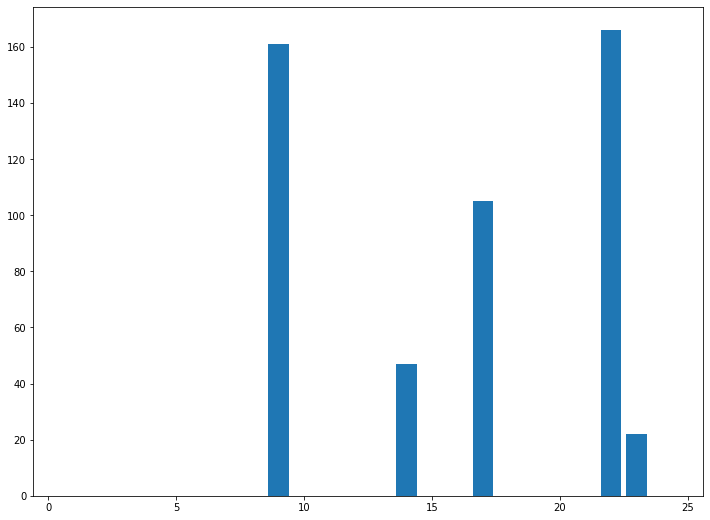

In [41]:
plt.figure(figsize = (12,9))
plt.bar(dfarray[:,0], dfarray[:,1])

<a id="word-cloud"></a>
### Word Cloud

preparation, we use jieba package to segment keyword, we'll introduce more later!

In [42]:
jieba.initialize()

jieba.set_dictionary('dict/dict.big.txt')

Building prefix dict from the default dictionary ...
Loading model from cache C:\Users\princ\AppData\Local\Temp\jieba.cache
Loading model cost 0.841 seconds.
Prefix dict has been built succesfully.


In [43]:
# 將標題 與 內文 合併一起做文字雲
raw_text = list(board_df["title"] + board_df["content"])

In [44]:
# 設定停用詞 (把不要的詞彙放在這兒)
with open('dict/stopwords.txt', 'r', encoding='utf8') as f:
    stops = f.read().split('\n')

In [45]:
raw_text_dic = {}
for line in raw_text:
    line = line.strip('\n')
    words = jieba.cut(line, cut_all=False)
    for word in words:
        if word not in stops:
            if len(word) > 1:
                word = str(word).strip().replace("\n", "").replace("\r", "").replace(" ", "")
                if word not in raw_text_dic:
                    raw_text_dic[word] = 1
                else:
                    raw_text_dic[word] += 1

Building prefix dict from D:\Programming\Python\課程教學\David Python 教育訓練\dict\dict.big.txt ...
Dumping model to file cache C:\Users\princ\AppData\Local\Temp\jieba.u9fe11b2227c896c5bbad65bb17730314.cache
Loading model cost 1.644 seconds.
Prefix dict has been built succesfully.


get wordcloud

In [46]:
alice_mask = np.array(Image.open("images/cloud_mask7.png"))
wc = WordCloud(background_color="white", max_words=2000, mask=alice_mask, font_path="font/msjh.ttc", width=2400, height=2400)
wc.generate_from_frequencies(raw_text_dic)

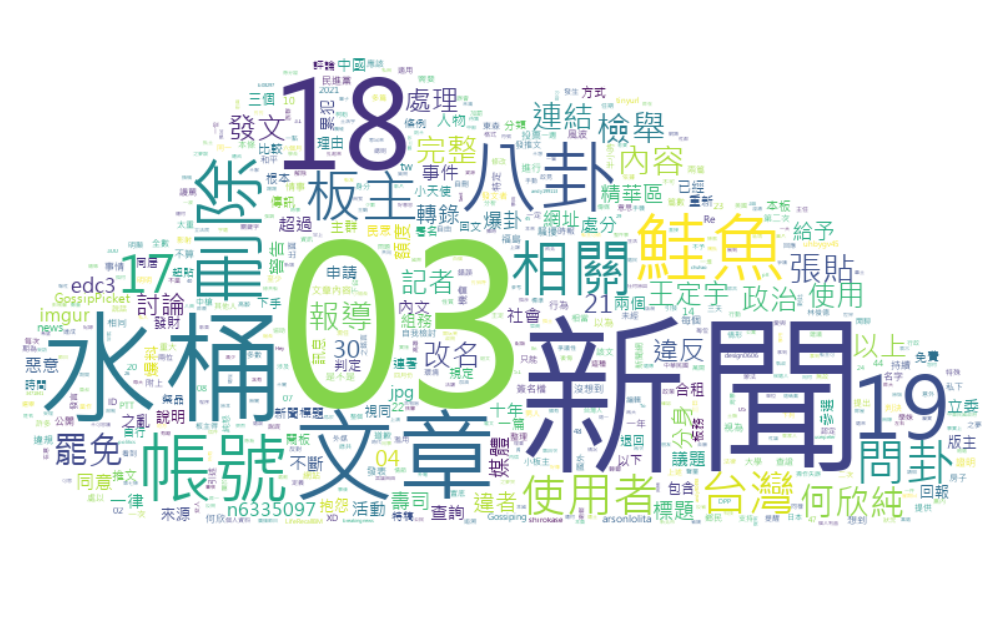

In [47]:
# show word cloud
plt.rcParams["figure.figsize"] = (200,100)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [48]:
# save word cloud image to file
picture_name = "images/wordcloud.png"
wc.to_file(picture_name)

<a id="ptt-sentimental-data-set"></a>
### Read PTT Sentimental data set

In [49]:
import pandas as pd
from pandas import ExcelWriter
from pandas import ExcelFile

df = pd.read_excel('opt/PTT_crawler_page_data.xlsx')
df = df[['comment_content','comment_status']]
df.head()

,comment_content,comment_status
0,不是時間管理大師的話只會搞死自己,→
1,就寶可夢的飛人啊,推
2,內鬥內行,推
3,你送完這單預期附近沒有餐廳 就預設飛回夜市或商圈等單,→
4,發惹，大家衝啊！,推


In [50]:
def convert_ptt_flag(status):
    res_flag = 0
    if '推' in status:
        res_flag = 1
    elif '噓' in status:
        res_flag = 2
    return res_flag
if 'comment_status' in df.columns:
    df["comment_status"] = df["comment_status"].apply(lambda x: convert_ptt_flag(x))
    df.rename(columns = {'comment_status':'rating'}, inplace = True)
df = df[df.rating != 0]
df.head()

,comment_content,rating
1,就寶可夢的飛人啊,1
2,內鬥內行,1
4,發惹，大家衝啊！,1
5,pokemongo表示:笑死,1
6,fake gps的部分可以想像,1


In [51]:
df = df.drop_duplicates(subset='comment_content', keep="last")
df.head()

,comment_content,rating
1,就寶可夢的飛人啊,1
2,內鬥內行,1
4,發惹，大家衝啊！,1
5,pokemongo表示:笑死,1
6,fake gps的部分可以想像,1


### Homework
Agents, here is the mission for you

Project: You are a researcher works at social analysis company, please find out a specific industrial insights from netizen on ptt.cc.

1. Select a board from ptt.cc (such as Gossiping or NBA etc.) which you’re interested in.

2. Using David’s ptt crawler as template. 

3. Look for insights depends on your observation, and share your findings and send a brief report to David.

4. Share your report on our Facebook group.